In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as exp
from plotly._subplots import make_subplots
import plotly.graph_objects as go

In [2]:
data= pd.read_csv("ALL.csv")

In [3]:
data.head()

,Timestamp,CO (ppm),NO2 (ppm),CO2 (ppm),TVOC (ppb),PM1 (ug/m3),PM2.5 (ug/m3),PM10 (ug/m3),Temperature (C),Humidity (%),Sound (dB),Occupancy,Position,Room Condition,Room Type,Floor No.,Weather,Occupancy_Classified
0,2023-08-16 11:16:33,36.3,0.1,1701.0,0.0,44.0,65.0,70.0,26.1,14.1,72.1,26.0,middle,ac,lab,2.0,sunny,Occ_Class_3
1,2023-08-16 11:16:38,36.1,0.1,1699.0,0.0,44.0,64.0,69.0,26.1,14.1,70.5,26.0,middle,ac,lab,2.0,sunny,Occ_Class_3
2,2023-08-16 11:16:44,36.5,0.1,1695.0,0.0,44.0,64.0,69.0,26.1,14.1,77.2,26.0,middle,ac,lab,2.0,sunny,Occ_Class_3
3,2023-08-16 11:16:50,34.2,0.1,1690.0,0.0,43.0,64.0,68.0,26.1,14.1,72.2,26.0,middle,ac,lab,2.0,sunny,Occ_Class_3
4,2023-08-16 11:16:55,36.3,0.1,1684.0,0.0,43.0,64.0,67.0,26.1,14.0,75.3,26.0,middle,ac,lab,2.0,sunny,Occ_Class_3


In [4]:
data.shape

(12071, 18)

In [5]:
data.describe()

,TVOC (ppb),PM1 (ug/m3),PM2.5 (ug/m3),PM10 (ug/m3),Temperature (C),Humidity (%),Sound (dB),Occupancy,Floor No.
count,12071.000000,12071.000000,12071.000000,12071.000000,12071.000000,12071.000000,12071.000000,12071.000000,12071.000000
mean,7.563002,27.947229,42.338166,46.185652,28.257079,15.106362,73.474186,22.656781,2.381327
std,26.734792,13.234140,18.387123,19.273338,2.798545,1.391042,4.402604,17.022878,0.735295
min,0.000000,1.000000,4.000000,5.000000,23.200000,12.600000,63.800000,0.000000,0.000000
25%,0.000000,20.000000,31.000000,33.000000,25.800000,13.900000,70.700000,8.000000,2.000000
50%,0.000000,31.000000,45.000000,48.000000,28.100000,15.000000,73.300000,17.000000,2.000000
75%,0.000000,37.000000,56.000000,60.000000,30.600000,16.200000,76.800000,37.000000,3.000000
max,172.000000,55.000000,80.000000,86.000000,36.200000,19.100000,87.800000,59.000000,3.000000


In [6]:
for i in data:
    print(data[data[i]=='$'].value_counts().sum())

0
3118
3118
459
0
0
0
0
0
0
0
0
0
0
0
0
0
0


In [7]:
# mod_data= data[['CO (ppm)']+['NO2 (ppm)']+['CO2 (ppm)']+['TVOC (ppb)']+['PM2.5 (ug/m3)']+['PM10 (ug/m3)']+['Temperature (C)']+['Humidity (%)']+['Sound (dB)']+['Occupancy']]
# mod_data.head(3)

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12071 entries, 0 to 12070
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Timestamp             12071 non-null  object 
 1   CO (ppm)              12071 non-null  object 
 2   NO2 (ppm)             12071 non-null  object 
 3   CO2 (ppm)             12071 non-null  object 
 4   TVOC (ppb)            12071 non-null  float64
 5   PM1 (ug/m3)           12071 non-null  float64
 6   PM2.5 (ug/m3)         12071 non-null  float64
 7   PM10 (ug/m3)          12071 non-null  float64
 8   Temperature (C)       12071 non-null  float64
 9   Humidity (%)          12071 non-null  float64
 10  Sound (dB)            12071 non-null  float64
 11  Occupancy             12071 non-null  float64
 12  Position              12071 non-null  object 
 13  Room Condition        12071 non-null  object 
 14  Room Type             12071 non-null  object 
 15  Floor No.          

In [9]:
data = data.drop(data.loc[data['CO2 (ppm)']=='$'].index)
for i in data:
    print(data[data[i]=='$'].value_counts().sum())

0
2686
2686
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


In [10]:
data = data.drop(data.loc[data['CO (ppm)']=='$'].index)
for i in data:
    print(data[data[i]=='$'].value_counts().sum())

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


In [11]:
# for i in data:
#     print(data[data[i]=='$'].value_counts().sum())

In [12]:
data.head(3)

,Timestamp,CO (ppm),NO2 (ppm),CO2 (ppm),TVOC (ppb),PM1 (ug/m3),PM2.5 (ug/m3),PM10 (ug/m3),Temperature (C),Humidity (%),Sound (dB),Occupancy,Position,Room Condition,Room Type,Floor No.,Weather,Occupancy_Classified
0,2023-08-16 11:16:33,36.3,0.1,1701.0,0.0,44.0,65.0,70.0,26.1,14.1,72.1,26.0,middle,ac,lab,2.0,sunny,Occ_Class_3
1,2023-08-16 11:16:38,36.1,0.1,1699.0,0.0,44.0,64.0,69.0,26.1,14.1,70.5,26.0,middle,ac,lab,2.0,sunny,Occ_Class_3
2,2023-08-16 11:16:44,36.5,0.1,1695.0,0.0,44.0,64.0,69.0,26.1,14.1,77.2,26.0,middle,ac,lab,2.0,sunny,Occ_Class_3


In [13]:
data['CO (ppm)']=data['CO (ppm)'].astype(float)
data['NO2 (ppm)']=data['NO2 (ppm)'].astype(float)
data['CO2 (ppm)']=data['CO2 (ppm)'].astype(float)

In [14]:
data.shape

(8926, 18)

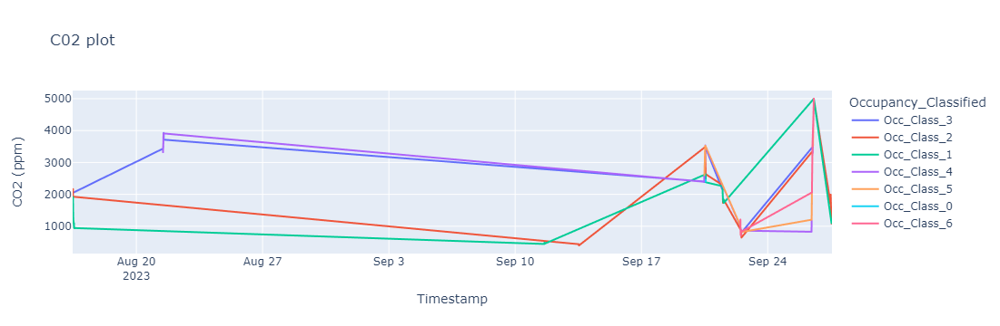

In [15]:
exp.line(data_frame=data,x=data['Timestamp'],y=data['CO2 (ppm)'],color=data['Occupancy_Classified'],title='C02 plot')

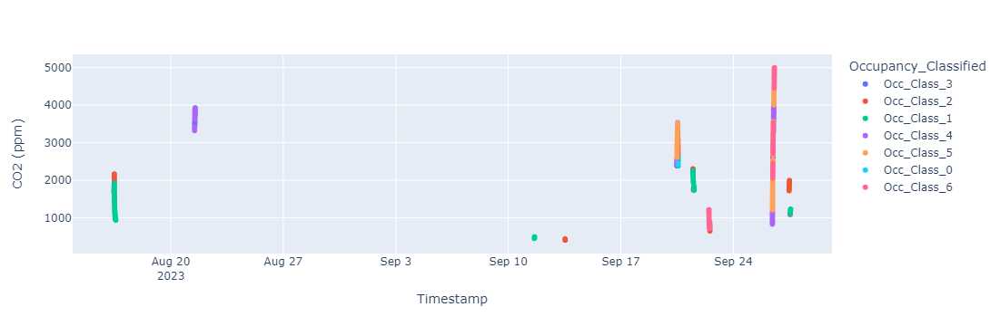

In [16]:
exp.scatter(data_frame=data,x=data['Timestamp'],y=data['CO2 (ppm)'],color=data['Occupancy_Classified'])

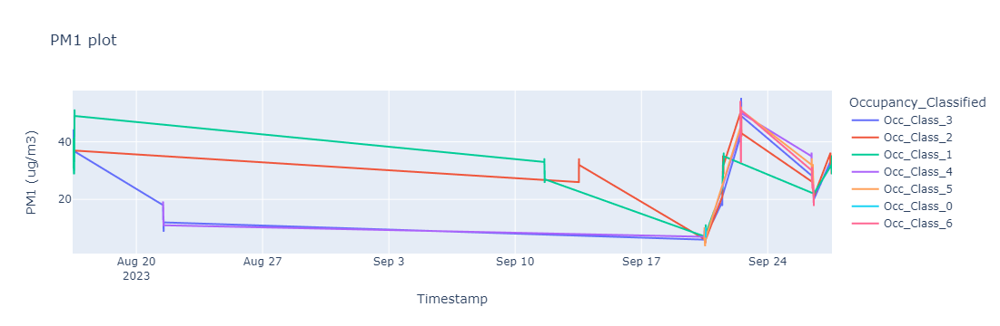

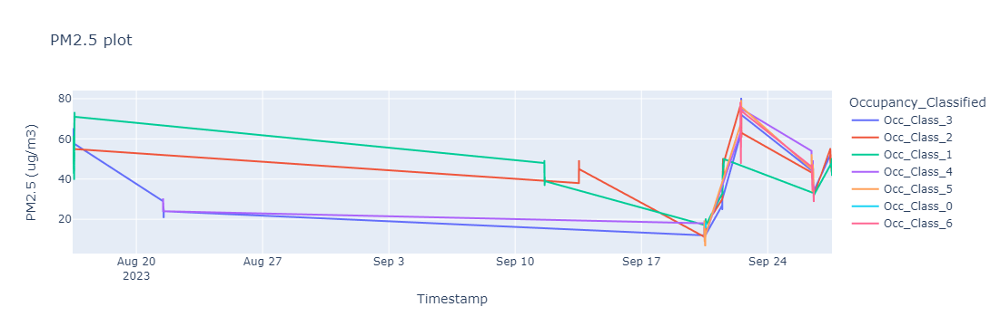

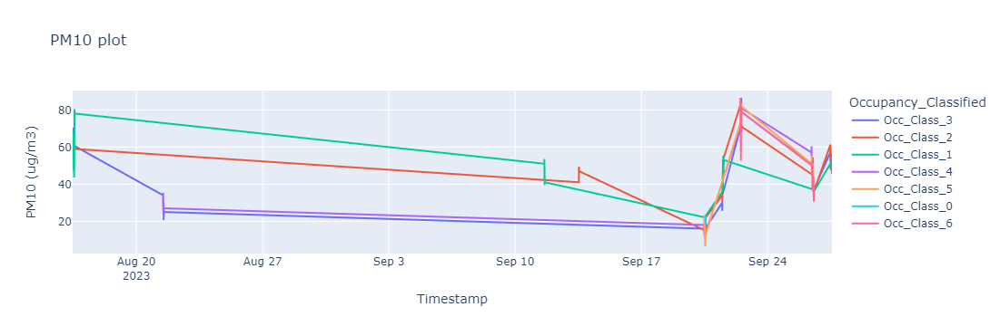

In [17]:
fig1= exp.line(data_frame=data,x=data['Timestamp'],y=data['PM1 (ug/m3)'],color=data['Occupancy_Classified'],title='PM1 plot')
fig2 = exp.line(data_frame=data,x=data['Timestamp'],y=data['PM2.5 (ug/m3)'],color=data['Occupancy_Classified'],title='PM2.5 plot')
fig3= exp.line(data_frame=data,x=data['Timestamp'],y=data['PM10 (ug/m3)'],color=data['Occupancy_Classified'],title='PM10 plot')
fig1.show()
fig2.show()
fig3.show()

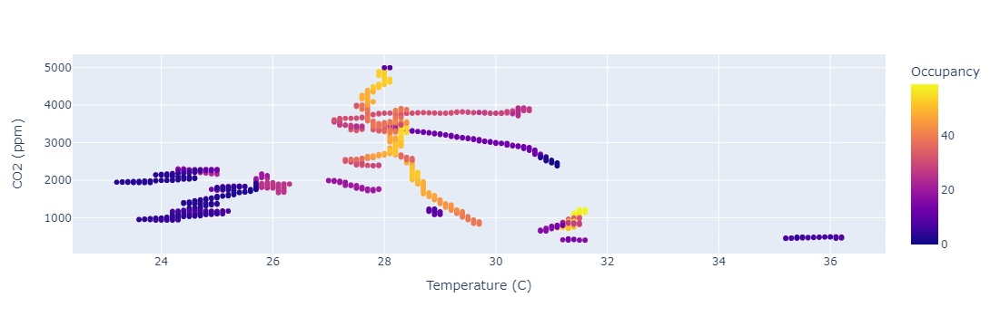

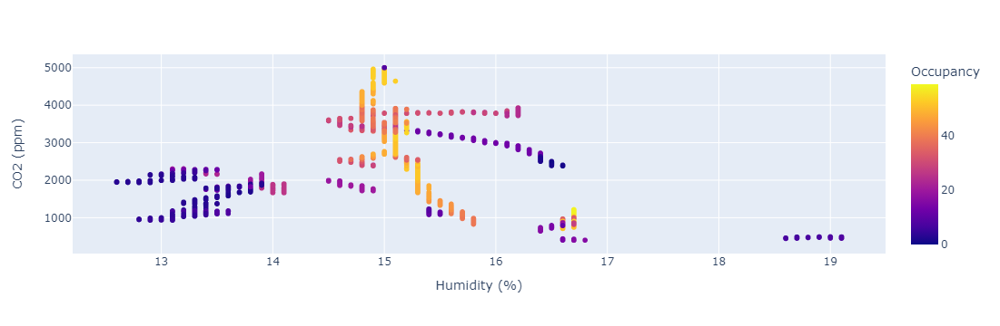

In [18]:
fig1=exp.scatter(data_frame=data,x=data['Temperature (C)'],y=data['CO2 (ppm)'],color=data['Occupancy'])
fig1.show()
fig2= exp.scatter(data_frame=data,x=data['Humidity (%)'],y=data['CO2 (ppm)'],color=data['Occupancy'])
fig2.show()

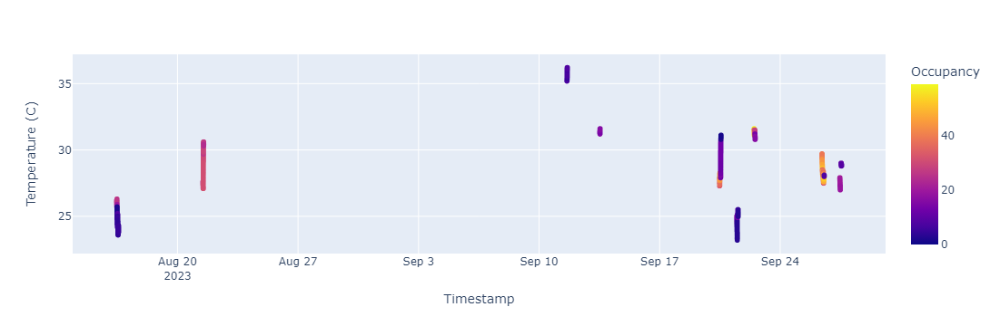

In [19]:
exp.scatter(data_frame=data,x=data['Timestamp'],y=data['Temperature (C)'],color=data['Occupancy'])

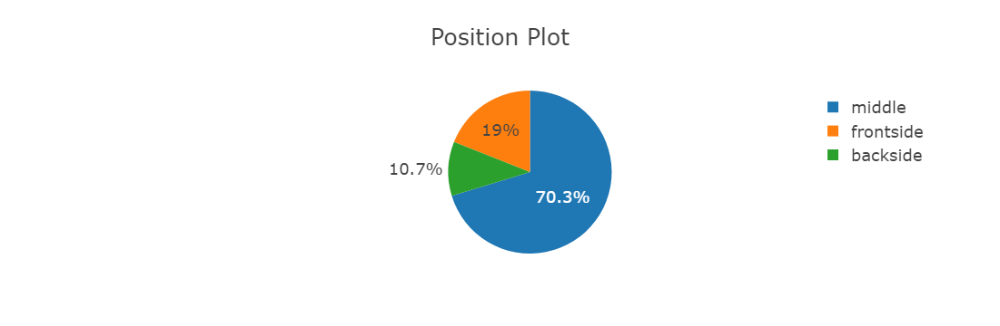

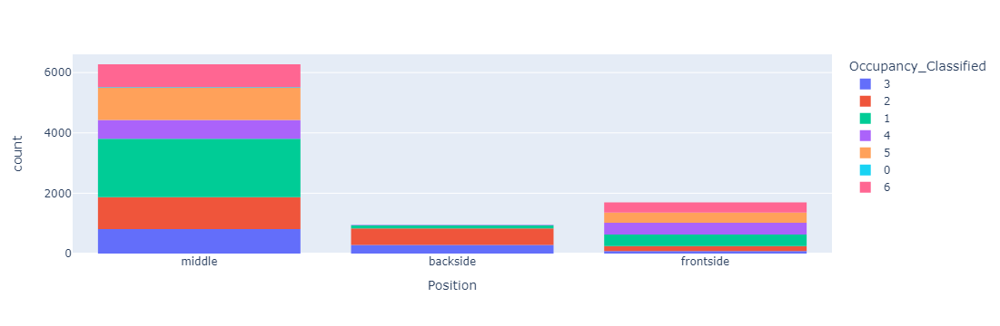

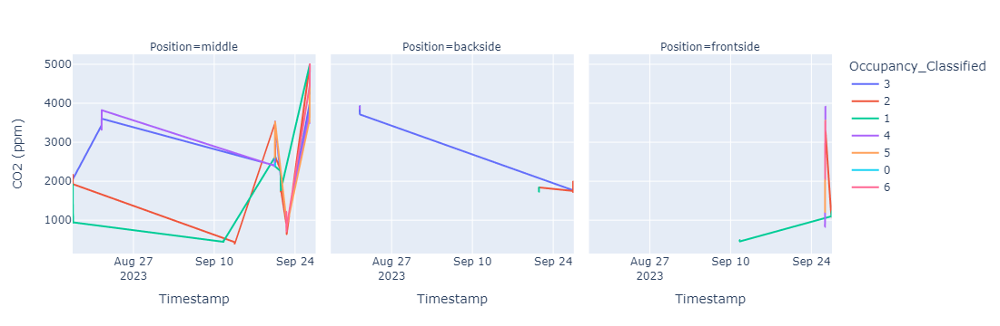

In [25]:
fig1=exp.pie(data_frame=data,names=data['Position'],template='presentation',title="Position Plot")
fig2 = exp.histogram(data_frame=data,x=data['Position'],color=data['Occupancy_Classified'])
fig3= exp.line(data_frame=data,x=data['Timestamp'],y=data['CO2 (ppm)'],color=data["Occupancy_Classified"],facet_col=data['Position'])
fig1.show()
fig2.show()
fig3.show()

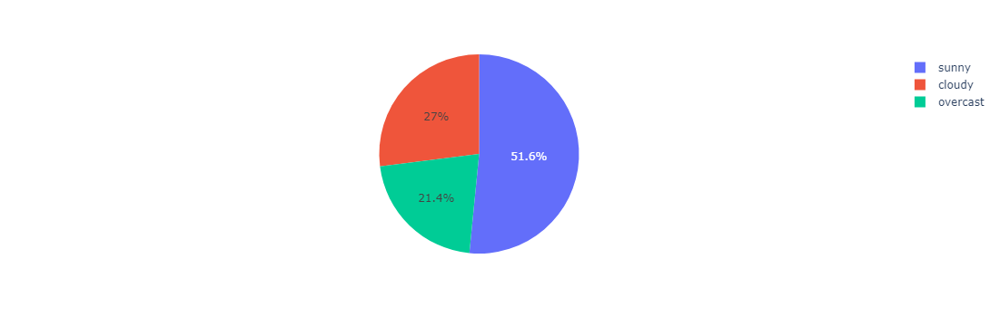

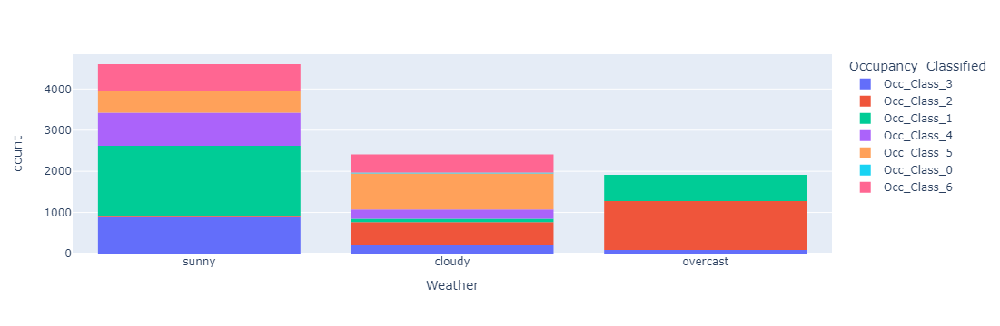

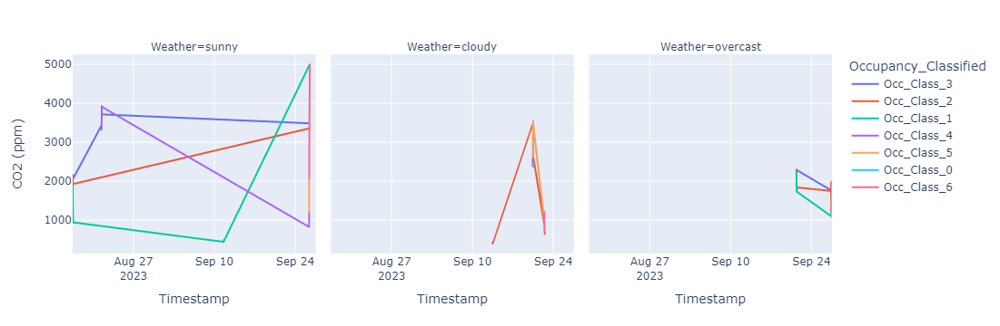

In [21]:
fig1=exp.pie(data_frame=data,names=data['Weather'])
fig2 = exp.histogram(data_frame=data,x=data['Weather'],color=data['Occupancy_Classified'])
fig1.show()
fig2.show()
exp.line(data_frame=data,x=data['Timestamp'],y=data['CO2 (ppm)'],color=data["Occupancy_Classified"],facet_col=data['Weather'])

Text(0.5, 1.0, 'Correlation with the attributes')

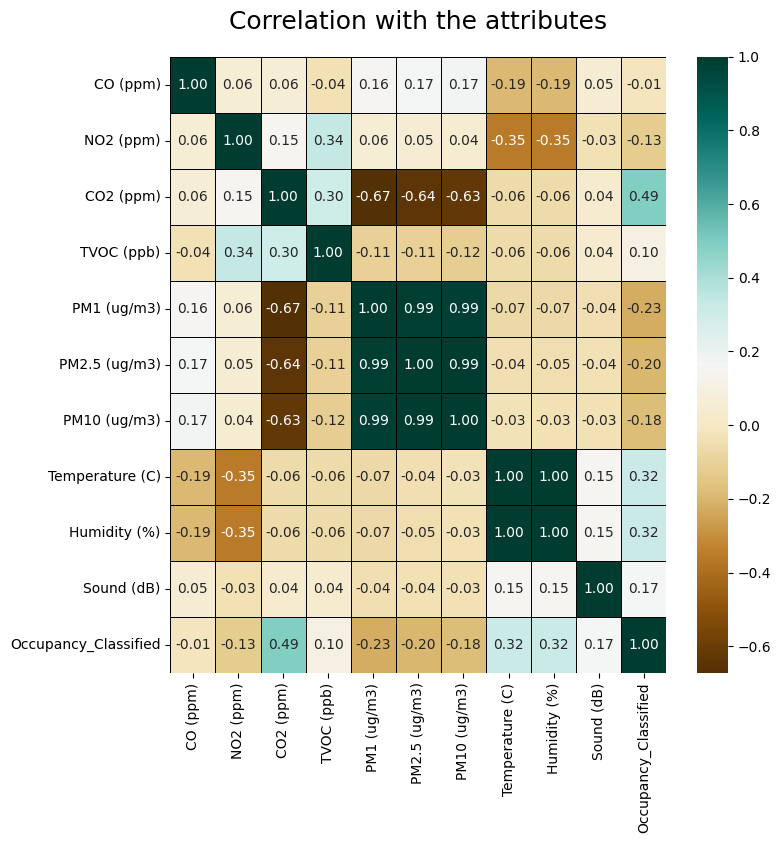

In [29]:
# data = data.drop(['Timestamp','Position','Room Condition','Room Type','Weather','Occupancy','Floor No.'],axis=1)
# data['Occupancy_Classified'].astype(dtype='category')
data['Occupancy_Classified']=data['Occupancy_Classified'].str.replace('Occ_Class_','')
# data.info()
plt.figure(figsize=(8,8))
heatmap=sns.heatmap(data.corr(),annot=True,fmt='0.2f',cmap='BrBG',linewidths=0.5,linecolor='black')
heatmap.set_title("Correlation with the attributes",fontdict={'fontsize':18},pad=20)

Text(0.5, 1.0, 'Correlation with Occupancy Classified')

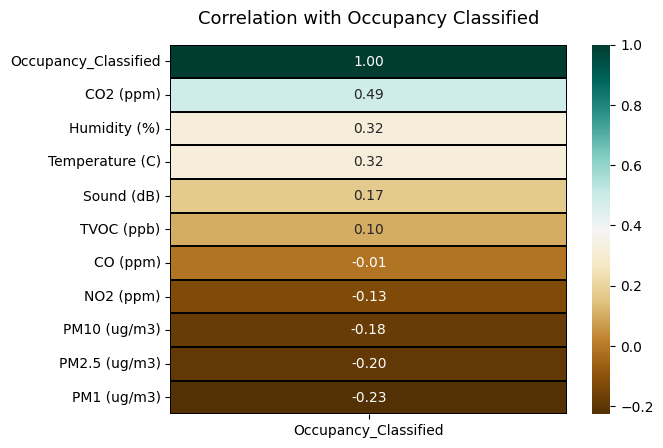

In [30]:
heatmap = sns.heatmap(data.corr()[['Occupancy_Classified']].sort_values(by='Occupancy_Classified',ascending=False),annot=True,fmt='0.2f',cmap='BrBG',linecolor='black',linewidths=0.1)
heatmap.set_title("Correlation with Occupancy Classified",fontdict={'fontsize':13},pad=15) 

# 